# Рынок заведений общественного питания Москвы

__Цель проекта:__ Исследование рынка общепита Москвы с целью дальнейшего выбора подходящего места для открытия кофейни мирового уровня.

__Задачи:__

   1. Загрузка и изучение данных о заведениях общественного питания Москвы: 
   
          1.1 Сколько заведений представлено? 
          1.2 Что можно сказать о каждом столбце? 
          1.3 Значения какого типа они хранят? 
          
   2. Предобработка данных: 
   
          2.1 Проверка на дубликаты
          2.2 Проверка на пропуски
          2.3 Создание столбцов street и is_24/7. 
   
   3. Исследовательский анализ данных:
   
          3.1  Категоризация заведений. 
          3.2  Колличество посадочных мест по категориям. 
          3.3  Отношение сетевых и несетевых заведений.
          3.4  Какие категории заведений чаще являются сетевыми?
          3.5  Топ 15 популярных сетей Москвы. Признаки и категории этих заведений.
          3.6  Распределение заведений по районам Москвы
          3.7  Распределение средних рейтингов по категориям заведений
          3.8  Отображение фоновой картограммы (хороплет) со средним рейтингом заведений каждого района.
          3.9  Отображение всех заведений датасета при помощи кластеров
          3.10 Топ 15 улиц по колличеству заведений
          3.11 Улицы, на которых находится только 1 обьект.
          3.12 Посчитать медиану среднего чека заведений каждого района. Построить фоновую картограмму результатов. 
          3.13 Исследование иных взаимосвязей (часы работы, низкий рейтинг и их зависимость от расположения и категории).
          3.14 Общий вывод.
          
   4. Детализация исследования и ответы на вопросы: 
   
          4.1 Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
          4.2 Есть ли круглосуточные кофейни?
          4.3 Какие у кофеен рейтинги? Как они распределяются по районам?
          4.4 На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
          4.5 Общий вывод.
         
   5. Подготовка и оформление презентации для инвесторов. 
   
   6. Общий вывод.

# Описание

__Файл `moscow_places.csv`:__

   - `name` — название заведения;
   - `address` — адрес заведения;
   - `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
   - `hours` — информация о днях и часах работы;
   - `lat` — широта географической точки, в которой находится заведение;
   - `lng` — долгота географической точки, в которой находится заведение;
   - `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
   - `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
   - `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
   
         - «Средний счёт: 1000–1500 ₽»;
         - «Цена чашки капучино: 130–220 ₽»;
         - «Цена бокала пива: 400–600 ₽» и так далее;
           
           
   - `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
   
         - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
         - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
         - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
        
   - `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
   
         - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
         - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
         - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
        
   - `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
         - 0 — заведение не является сетевым
         - 1 — заведение является сетевым
        
   - `district` — административный район, в котором находится заведение, например Центральный административный округ;
   - `seats` — количество посадочных мест.


## Загрузка и изучение данных о заведениях общественного питания Москвы

In [1]:
# импортируем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем карту и хороплет
from folium import Map, Choropleth
import plotly.express as px 
from plotly import graph_objects as go

In [2]:
# Загрузка данных датасета
data = pd.read_csv('/datasets/moscow_places.csv')
pd.set_option('display.max_colwidth', 500)
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


__Сколько заведений представлено?__ 
Предварительно, без учета возможных дублей, представлено 8 406 заведений в Москве. 

__Что можно сказать о каждом столбце?__
В каждом столбце представлена характеристика заведения: название, адрес, часты работы и пр. Сразу видно, что часть данных отсуствует, а в столбцах с рейтингом и колличеством посадочных мест стоит поменять формат данных.

__Значения какого типа они хранят?__
Данные хранят следующие типы значений: object, float64 и int64. 

## Предобработка данных


### Проверка на дубликаты

In [4]:
# Перед проверкой на дубликаты, переведем значения столбца name к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
print('Колличество дубликатов:', data.duplicated().sum())

Колличество дубликатов: 0


In [5]:
# Проверим неявные дубликаты через сравнение нескольких столбцов

data[data[['name','address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


В ходе проврки на неявные дубликаты обнаружили 4 дубликата. Предположим, что это ошибка выгрузки. Точечно удалим строки.

In [6]:
#Удалим неявные дубликаты

data = data.drop(index=[189,1430,2211,3109]).reset_index(drop=True)
data[data[['name','address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


### Проверка на пропуски

In [7]:
# Ищем сумарное колличество пропусков
print('Колличество пропусков, шт:', data.isna().sum().sum())
print('Колличество пропусков, %:', ((data.isna().sum().sum())/ (len(data)*13)*100).round(1))

Колличество пропусков, шт: 26938
Колличество пропусков, %: 24.7


In [8]:
# Ищем сумарное колличество пропусков в разбивке по столбцам
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

In [9]:
# Ищем процентное колличество пропусков по столбцам
(data.isna().sum()/ len(data)*100).round(1)

name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.4
lat                   0.0
lng                   0.0
rating                0.0
price                60.5
avg_bill             54.6
middle_avg_bill      62.5
middle_coffee_cup    93.6
chain                 0.0
seats                43.0
dtype: float64

### Добавляем столбцы

In [10]:
# создаем столбец с названием улицы
data['street'] = data['address'].apply(lambda x: x.split(sep=', ')[1])

In [11]:
# создаем столбец is_24/7, в котором будет отображен график работы ежедневно и круглосуточно или другой 

data['is_24/7'] = data[data['hours'].apply(lambda x: 'ежедневно, круглосуточно' in str(x))]\
                    ['hours'] == 'ежедневно, круглосуточно'
# Заменим пропуски в столбце is_24/7 на False
data['is_24/7'] = data['is_24/7'].fillna(False)

data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


__Вывод:__ 

  - Стобцы is_24/7 и street добавлены. 
  - Дубликатов и существенных аномалий нет.
  - Пропусков почти 27 000 или 25% от нормы. Пропущено более 50% в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup и seats, которые связаны между собой. Удаление или дополнение медианой одного столбца может искать картину по другим. Данные с пропусками оставляем.

## Исследовательский анализ данных

### Категоризация заведений

In [12]:
# Смотрим категории заведений и общее колличество
category = data.category.unique()
print('Всего', len(category), 'категорий заведений:', '; '.join(category))

Всего 8 категорий заведений: кафе; ресторан; кофейня; пиццерия; бар,паб; быстрое питание; булочная; столовая


In [13]:
# Создадим таблицу для дальнейшей визуализации колличественного распределения категорий заведений

count_category = data.groupby('category').agg({'address':'count'})\
.sort_values(by='address', ascending=False) 
count_category = count_category.reset_index()
count_category.columns = ['category','count']
count_category['percent'] = ((count_category['count']/data['address'].count())*100).round(1)
count_category

,category,count,percent
0,кафе,2376,28.3
1,ресторан,2041,24.3
2,кофейня,1413,16.8
3,"бар,паб",765,9.1
4,пиццерия,633,7.5
5,быстрое питание,603,7.2
6,столовая,315,3.7
7,булочная,256,3.0


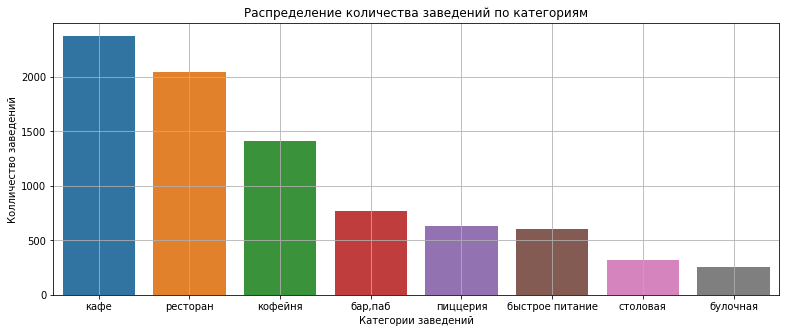

In [14]:
# Визуализируем распределение количества заведений по категориям, выделим ТОП 3 категории. 

plt.figure(figsize=(13,5))

sns.barplot(y='count', x='category', data=count_category);
plt.xlabel('Категории заведений')
plt.grid()
plt.ylabel('Колличество заведений')
plt.title('Распределение количества заведений по категориям')
plt.show()

__Вывод:__ Самая популярная категория общепита - `кафе` с долей 28.3% или 2 378 заведений. Кофейни занимают третье место 13% или 1 413 штук. Самая маленькая доля у булочных - 3% или 256 штук. 

Более 50% или 5 834 общепитов Москвы занимают три категории в порядке убывания пристутствия: Кафе, рестораны, кофейни. 

### Медианное колличество посадочных мест по категориям.

In [15]:
seats_category = data.groupby('category').agg({'seats':'median'})\
.sort_values(by='seats', ascending=False) 
seats_category = seats_category.reset_index()
seats_category

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


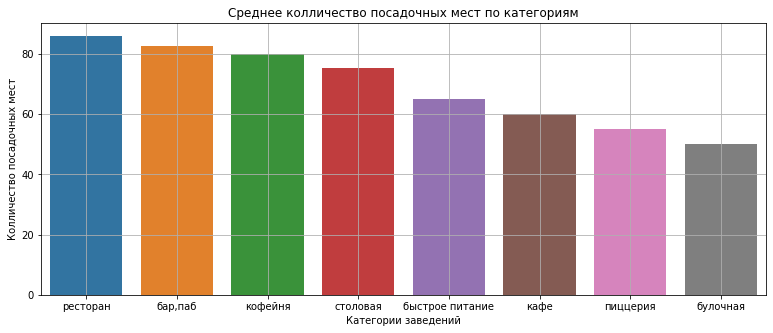

In [16]:
# Визуализируем распределение колличества посадочных мест по категориям

plt.figure(figsize=(13,5))

sns.barplot(y='seats', x='category', data=seats_category);
plt.xlabel('Категории заведений')
plt.grid()
plt.ylabel('Колличество посадочных мест')
plt.title('Среднее колличество посадочных мест по категориям')
plt.show()

__Вывод:__

По колличеству посадочных мест в лидерах следующие категории заведений: рестораны, бары, кофейни, столовые. В целом медианное колличество посадочных мест варьирует от 50-86.

### Отношение сетевых и несетевых заведений

In [17]:
count_chain = data.pivot_table(index=['chain'], values='address', aggfunc='count')\
                                      .sort_values(by = 'address', ascending=False)
count_chain.columns= ['values']

name_chain = count_chain.index
values = count_chain['values']

fig = go.Figure(data=[go.Pie(labels=name_chain, values=values)])
fig.update_layout(title='Распределение заведений на сетевые и несетевые')          
fig.show()

__Вывод:__ Несетевых заведений больше, чем сетевых в соотношении 62%/38% или 5201/3205. 

### Какие категории заведений чаще являются сетевыми? 

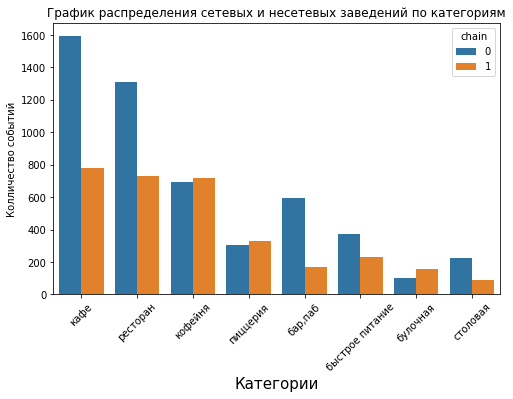

In [18]:
# Определяем какие категории общепита чаще являются сетевыми 

plt.figure(figsize =(8, 5))
sns.countplot(data=data, x="category", hue="chain")
plt.title('График распределения сетевых и несетевых заведений по категориям')
plt.xlabel('Колличество заведений')
plt.xticks(rotation=45)
plt.xlabel('Категории', fontsize=15)
plt.ylabel('Колличество событий')
plt.show()

__Вывод:__
Из графика видим, что кофейни чаще бывают сетевыми. Кафе, рестраны и бары чаще не сетевые. 

### Топ 15 популярных сетей Москвы

In [19]:
# Возьмем только сетевые заведения
chain_data = data[data['chain'] == 1]

# Ищем топ-15 популярных сетей в Москве. 

top_name = chain_data.groupby('name').agg({'address':'count'})\
.sort_values(by='address', ascending=False).head(15)
top_name = top_name.reset_index()
top_name.columns = ['name','count']
top_name

,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


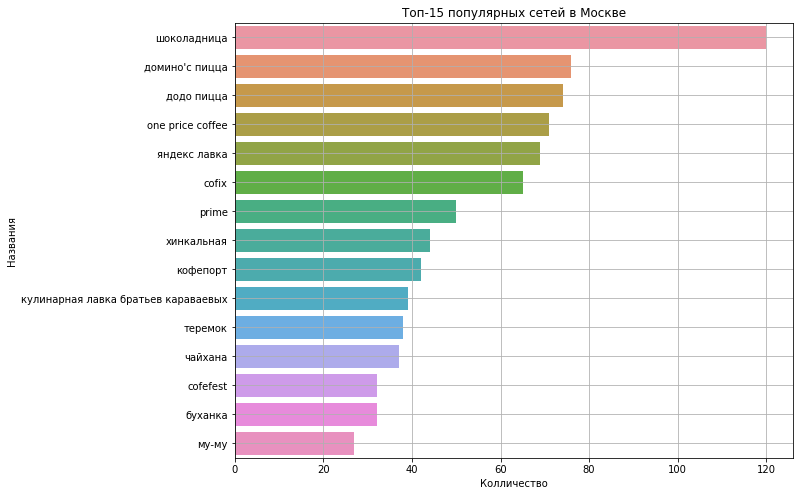

In [20]:
# Визуализируем топ-15 популярных сетей в Москве. 

plt.figure(figsize=(10,8))

sns.barplot(y='name', x='count', data=top_name);
plt.xlabel('Колличество')
plt.grid()
plt.ylabel('Названия')
plt.title('Топ-15 популярных сетей в Москве')
plt.show()

In [21]:
#Ищем категории ТОП 15 заведений Москвы
name_category = chain_data.groupby(['name', 'category']).agg({'name': ['count']}). reset_index()
name_category.columns = ['name','category','count']
name_category.sort_values(by = 'count', ascending=False).head(15)

,name,category,count
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


__Вывод:__ 

Наиболее популярные сети общепитов: Шоколадница, Домино'с Пицца и Додо пицца с колличеством заведений 70-120 точек. ТОП заведений относится к категории кофейни и пицерии. Все перечисленные заведения знакомы мне, как пользователю. Их всех обьединяет три рыночных требования крупной сети: быстро, вкусно и единый стиль.

### Распределение заведений по районам Москвы

In [22]:
# Создаем таблицу ТОП 15 улиц по колличеству заведений

distr_cat = data['district'].value_counts().reset_index().head(15)
distr_cat.columns = ['district','count']
distr_cat['percent'] = ((distr_cat['count']/data['district'].count())*100).round(1)
distr_cat

,district,count,percent
0,Центральный административный округ,2242,26.7
1,Северный административный округ,898,10.7
2,Южный административный округ,892,10.6
3,Северо-Восточный административный округ,890,10.6
4,Западный административный округ,850,10.1
5,Восточный административный округ,798,9.5
6,Юго-Восточный административный округ,714,8.5
7,Юго-Западный административный округ,709,8.4
8,Северо-Западный административный округ,409,4.9


In [23]:
# Создаем таблицу распределения заведений по категориям и районам

distr_category = data.groupby(['district', 'category'])['name'].count().reset_index()
distr_category.columns = ['district', 'category', 'count']
distr_category.sort_values('count', ascending=False).head(15)

,district,category,count
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
3,Восточный административный округ,кафе,272
27,Северо-Восточный административный округ,кафе,269
67,Южный административный округ,кафе,264
11,Западный административный округ,кафе,238
59,Юго-Западный административный округ,кафе,238


In [24]:
# Визуализируем распределение заведений по категориям и районам

fig = px.bar(distr_category, 
             x='count', 
             y='district',                  
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Район',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

In [25]:
# Визуализируем распределение заведений по категориям и районам без Центрального района
distr_category = distr_category[distr_category['district']!= 'Центральный административный округ']

fig = px.bar(distr_category, 
             x='count', 
             y='district',                  
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Район',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

__Вывод:__ 

Заведения представлены в следующих административных округах Москвы: Северный, Северо-Восточный, Северо-Западный, Южный, Юго-Западный, Западный, Центральный, Восточный, Юго-Восточный. 

Самый популярный район - Центральный. В Центральном округе лидируют `рестораны`, на втором месте `кафе`, на третьем - `кофейни`. Популярность района объясняется концентрацией бизнеса, культуры, достопримечательностей. `Самый не популярный район - Северо-Восток`. Северо-восток считается спальным районом со стоимостью недвижимости в среднем ниже, чем в др районах Москвы.

### Распределение средних рейтингов по категориям заведений

In [26]:
rating_category = data.groupby('category').agg({'rating':'mean'})\
.sort_values(by='rating', ascending=False) 
rating_category = rating_category.reset_index()
rating_category

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290348
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.124285
7,быстрое питание,4.050249


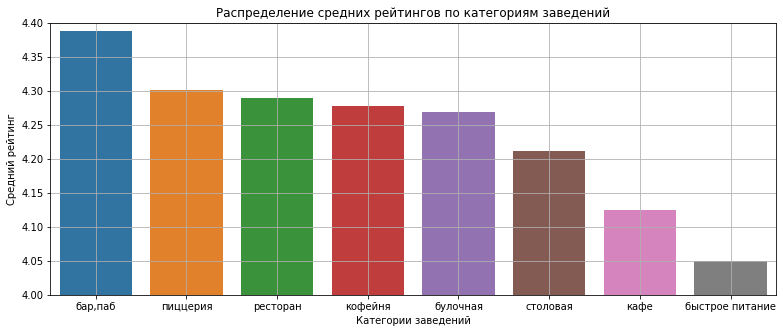

In [27]:
# Визуализируем распределение средних рейтингов

plt.figure(figsize=(13,5))

sns.barplot(y='rating', x='category', data=rating_category);
plt.ylim(4,4.4)
plt.xlabel('Категории заведений')
plt.grid()
plt.ylabel('Средний рейтинг')
plt.title('Распределение средних рейтингов по категориям заведений')
plt.show()

__Вывод:__ Наивысший рейтинг у баров и пабов - почти 4.4. Пиццерии, рестораны, кофейни и булочные имеют примерно одинаковые рейтинг - 4.3. Самый низкий рейтинг у БИСТРО - 4. 

In [28]:
# Смотрим распределение рейтинга по районам
rating_district = data.groupby('district').agg({'rating':'mean'})\
.sort_values(by='rating', ascending=False) 
rating_district = rating_district.reset_index()
rating_district

,district,rating
0,Центральный административный округ,4.377520
1,Северный административный округ,4.240980
2,Северо-Западный административный округ,4.208802
3,Южный административный округ,4.184417
4,Западный административный округ,4.181647
5,Восточный административный округ,4.174185
6,Юго-Западный административный округ,4.172920
7,Северо-Восточный административный округ,4.147978
8,Юго-Восточный административный округ,4.101120


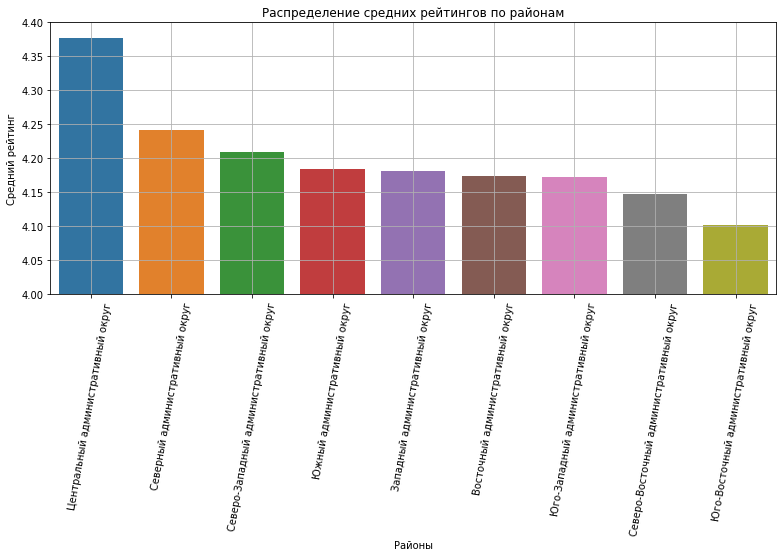

In [29]:
# Визуализируем распределение рейтинга по районам

plt.figure(figsize=(13,5))

sns.barplot(y='rating', x='district', data=rating_district);
plt.ylim(4,4.4)
plt.xlabel('Районы')
plt.grid()
plt.xticks(rotation=80)
plt.ylabel('Средний рейтинг')
plt.title('Распределение средних рейтингов по районам')
plt.show()

In [30]:
# Создадим функцию для построения графиков.
def heatmap(data, index, columns, values, aggfunc, title):
    data = data.pivot_table(index=index, columns=columns, values=values, aggfunc=aggfunc)
    plt.figure(figsize=(14,6))
    plt.title(title)
    sns.heatmap(data, annot=True)
    plt.show()

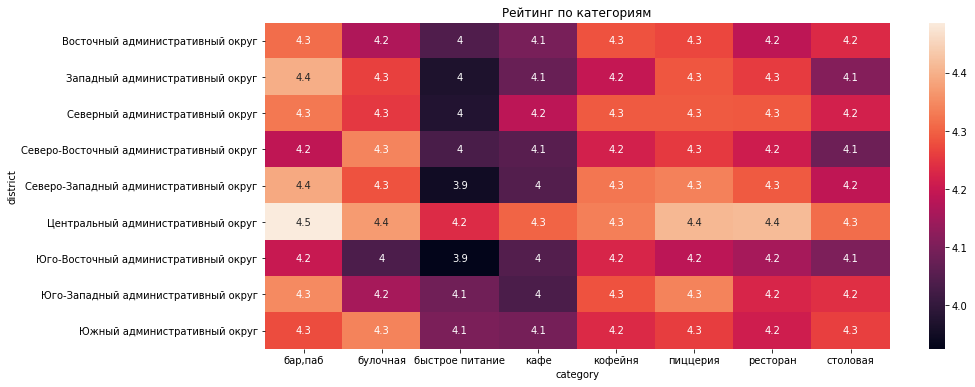

In [31]:
#Смотрим распределение рейтингов по районам
heatmap(data, 'district', 'category', 'rating', 'mean', 'Рейтинг по категориям')

__Вывод:__ 

Наибольшую усредненную оценку пользователей получают бар/паб, пиццерии и рестораны - `4.2-4.4` в Центральном, Западном и Юго-Западном районах. Наименьшая оценка у Бистро и кафе `4.2-3.9` в Юго-Восточном и Северо-Западных районах. 

### Отображение фоновой картограммы со средним рейтингом заведений каждого района.

In [32]:
# Создадим функцию для построения фоновой картограммы(хороплет) 

def map(data, group, column, agg, title):
    rating_df = data.groupby(group, as_index=False)[column].agg(agg)
    
    # загружаем JSON-файл с границами округов Москвы
    state_geo = '/datasets/admin_level_geomap.geojson'
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423
    
    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    
    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=rating_df,
        columns=[group, column],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title,
    ).add_to(m)
    
    # выводим карту
    return m

In [33]:
#выводим средний рейтинг заведений на карту Москвы
map(data, 'district', 'rating', 'mean', 'Средний рейтинг заведений по районам')

Выводы с предыдущих графиков подтверждаются. Самые высоки рейтиги у заведений в Центре и на Западе, самые низкие - на Юго-Востоке.

### Отображение всех заведений датасета при помощи кластеров

In [34]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Вывод: Больше всего заведений в Центральном районе. 

### Топ 15 улиц по колличеству заведений

In [35]:
# Создаем таблицу ТОП 15 улиц по колличеству заведений

top15str = data['street'].value_counts().reset_index().head(15)
top15str.columns = ['street_name','count']
top15str['percent'] = ((top15str['count']/data['street'].count())*100).round(1)

top15str

,street_name,count,percent
0,проспект мира,183,2.2
1,профсоюзная улица,122,1.5
2,проспект вернадского,108,1.3
3,ленинский проспект,107,1.3
4,ленинградский проспект,95,1.1
5,дмитровское шоссе,88,1.0
6,каширское шоссе,77,0.9
7,варшавское шоссе,76,0.9
8,ленинградское шоссе,70,0.8
9,мкад,65,0.8


In [36]:
# Создаем таблицу с названием улиц и категорий заведений

str_category = data.groupby(['street', 'category'])['name'].count().reset_index()
str_category.columns = ['street_name', 'category', 'count']
str_category.sort_values('count', ascending=False).head(15)

,street_name,category,count
2137,проспект мира,кафе,53
1520,мкад,кафе,45
2140,проспект мира,ресторан,44
2138,проспект мира,кофейня,36
2149,профсоюзная улица,кафе,35
1313,ленинский проспект,ресторан,33
2125,проспект вернадского,ресторан,33
2152,профсоюзная улица,ресторан,26
1305,ленинградское шоссе,ресторан,26
1310,ленинский проспект,кафе,26


In [37]:
# Оставим только улицы из топ 15.

str_category_top15 = str_category[str_category['street_name'].isin(top15str['street_name'])]
str_category_top15

,street_name,category,count
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3174,улица миклухо-маклая,быстрое питание,4
3175,улица миклухо-маклая,кафе,21
3176,улица миклухо-маклая,кофейня,4
3177,улица миклухо-маклая,пиццерия,2


In [38]:
# Визуализируем распределение ТОП 15 заведений 

fig = px.bar(str_category_top15, 
             x='count', 
             y='street_name',                  
             color='category'
            )

fig.update_layout(title='Топ 15 улиц по колличеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

__Вывод:__

Самая популярная улица по колличеству заведений - `Проспект мира` с тремя лидирующими категориями: кафе(53), ресторан(45), кофейня(36). Подобное соотношения наблюдается на остальных улицах из списка ТОП 15. 

### Улицы, на которых находится только 1 обьект.

In [39]:
one_count_str = data.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name')
one_count_str.columns = ['count']
one_count_str = one_count_str[one_count_str['count'] == 1]
one_count_str.head(5)

,count
street,
1-й автозаводский проезд,1
новосущёвская улица,1
новощукинская улица,1
новоясеневский тупик,1
одинцовская улица,1


In [40]:
print('Всего улиц с одним заведением общепита:', one_count_str.shape[0],)

Всего улиц с одним заведением общепита: 457


In [41]:
# Создадим датафрейм с этими улицами.
one_count_str = one_count_str.index
one_count_data = data.query('street in @one_count_str')

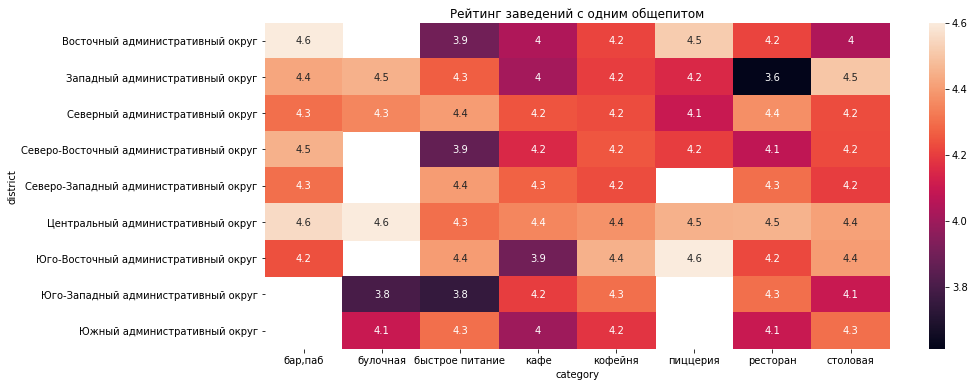

In [42]:
# Визуализируем рейтинги улиц с одним заведением общепита
heatmap(one_count_data, 'district', 'category', 'rating', 'mean', 'Рейтинг заведений с одним общепитом')

__Вывод:__ Признаки улиц, на которых 1 обьект общепита: маленькие улицы, промзона или спальный район. По графику видно, что улицы с одним общепитом есть во всех представленных округах. Наилучшие оценки топовые категории - кафе, кофейни и рестораны получают в Центральном округе, наименьшие оценки в Западном округе.

### Медиана среднего чека заведений каждого района.

In [43]:
# Смотрим медианы среднего чека по районам
median_bill_str = data.groupby('district').agg({'middle_avg_bill':'median'})\
.sort_values(by='middle_avg_bill', ascending=False) 
median_bill_str = median_bill_str.reset_index()
median_bill_str

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [44]:
# Строим фоновую картограмму (хороплет)  
map(data, 'district', 'middle_avg_bill', 'median', 'Медиана среднего чека заведений каждого района')

__Вывод:__ Самый высокий средний чек в Центральном и Западном районах - 1000 руб. Самые низкие цены в Южном и Юго-Восточном районах - 450-500 руб, что почти вдвое ниже лидирующих районов. Опять же связано со стоимостью аренды, уровнем жизни населения и проходимостью.

## Детализация исследования

Заказчикам исследования не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере. Определяем факторы успешности этой идеи. 

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [45]:
data_cat = data[data['category'] == 'кофейня']
print('Колличество кофеен:', data_cat.category.count())
print('Процент от общего числа общепита Москвы:', (data_cat.category.count()/ data.category.count()*100).round(1),'%')

Колличество кофеен: 1413
Процент от общего числа общепита Москвы: 16.8 %


In [46]:
# Смотрим распределение кофеен по районам

cof_district = data_cat.groupby('district').agg({'category':'count'}) \
 .sort_values(by='category', ascending=False)
cof_district = cof_district.reset_index()
cof_district.columns = ['district','count']
cof_district

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


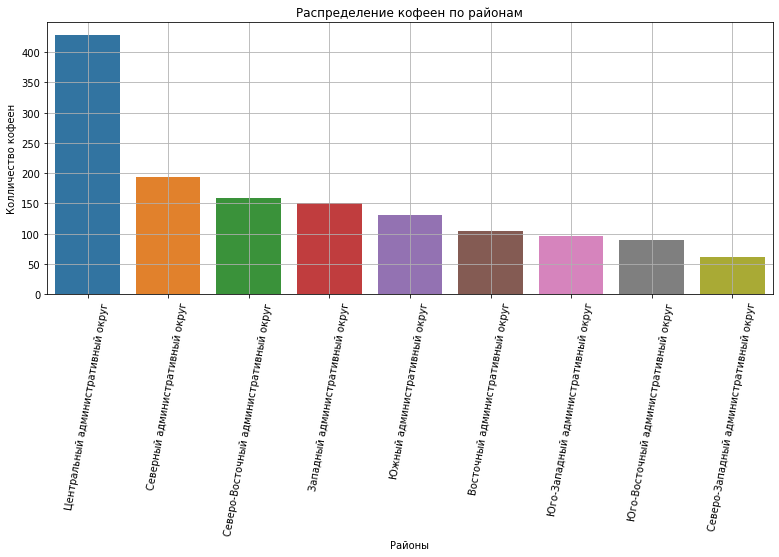

In [47]:
# Визуализируем распределение кофеен по районам

plt.figure(figsize=(13,5))

sns.barplot(y='count', x='district', data=cof_district);
plt.xlabel('Районы')
plt.grid()
plt.xticks(rotation=80)
plt.ylabel('Колличество кофеен')
plt.title('Распределение кофеен по районам')
plt.show()

__Вывод:__ 

Больше всего кофеен в Центральном районе, более чем в 2 раза больше, чем в остальных районах или 428 штук. Меньше всего кофеен в Северо-Западном районе - 62 кофейни. Причины на поверхности - кофеен больше там, где больше проходимость, где много офисных помещений. Мало кофеен в спальных и отдаленных от центра районах. 

### Наличие круглосуточных кофеен

In [48]:
print('Всего круглосуточных кофеен:', data_cat['is_24/7'].sum())

Всего круглосуточных кофеен: 59


In [49]:
#Смотрим распределение круглосуточных кофеен по районам
map(data_cat, 'district', 'is_24/7', 'sum', 'Количество круглосуточных кофеен')

В Центре больше всего круглосусточных кофеен. Основные причины - офисы работают до поздна и некоторые в выходные, поток туристов к достопримечательностям в центре москвы высокий и как правило не подчиняется будничному графику. 

### Рейтинги кофеен и их распределение по районам

In [50]:
# Смотрим распределение средних рейтингов кофеен по районам

cof_rating_district = data_cat.groupby('district').agg({'rating':'mean'}) \
 .sort_values(by='rating', ascending=False)
cof_rating_district = cof_rating_district.reset_index()
cof_rating_district.columns = ['district','avg_rating']
cof_rating_district

,district,avg_rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


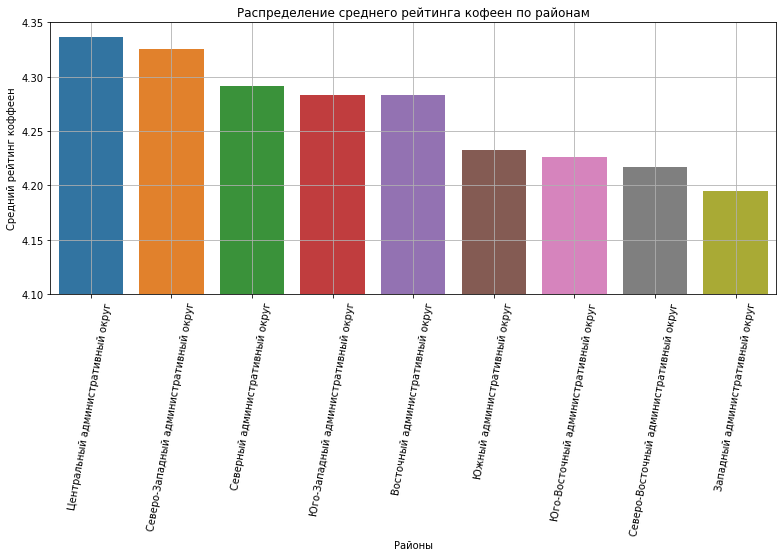

In [51]:
# Визуализируем распределение среднего рейтинга кофеен по районам

plt.figure(figsize=(13,5))

sns.barplot(y='avg_rating', x='district', data=cof_rating_district);
plt.xlabel('Районы')
plt.grid()
plt.ylim(4.1,4.35)
plt.xticks(rotation=80)
plt.ylabel('Средний рейтинг коффеен')
plt.title('Распределение среднего рейтинга кофеен по районам')
plt.show()

__Вывод:__ Наивысший рейтинг у Центральных и Северо-Запаных кофеен. Самый низкий в Западном округе. Причины, влияющие на рейтинг - уровень заведения, конкуренция. Где конкуренция выше, там выше уровень сервиса и предложений, соответственно выше оценки.

### Стоимость чашки капучино

In [52]:
# Перед проверкой средней стоимости узнаем есть ли аномалии в столбце
data_cat.middle_coffee_cup.describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

1 568 руб. не стоит даже самая дорогая чашка кофе в Москве. Удаляем. 

In [53]:
data_cat = data_cat[data_cat['middle_coffee_cup'] < 500]

In [54]:
print('Средняя стоимость чашки кофе в Московских кофейнях:', (data_cat.middle_coffee_cup.median()).round(1))

Средняя стоимость чашки кофе в Московских кофейнях: 169.5


In [55]:
# Проверим стотмость чашки кофе по районам

cof_rating_соffe = data_cat.groupby('district').agg({'middle_coffee_cup':'median'}) \
 .sort_values(by='middle_coffee_cup', ascending=False)
cof_rating_соffe

,middle_coffee_cup
district,
Юго-Западный административный округ,198.0
Центральный административный округ,190.0
Западный административный округ,189.0
Северо-Западный административный округ,165.0
Северо-Восточный административный округ,162.5
Северный административный округ,159.0
Южный административный округ,150.0
Юго-Восточный административный округ,147.5
Восточный административный округ,135.0


__Вывод:__ 

    - Всего в Москве 1 413 кофеен или 17% от всех заведений Москвы. 
    - Кофеен в Центральном районе, более чем в 2 раза больше, чем в остальных районах или 428 штук. Меньше всего кофеен в Северо-Западном районе - 62 кофейни. Причины на поверхности - кофеен больше там, где больше проходимость, много офисных помещений и туристических объектов. Мало кофеен в спальных и отдаленных от центра районах.
    - В Центре больше всего круглосусточных кофеен. Основные причины - офисы, туристические обьекты, активность города. 
    - Наивысший рейтинг у Центральных и Северо-Запаных кофеен. Самый низкий в Западном округе. Где конкуренция выше, там выше уровень сервиса и предложений, соответственно выше оценки.
    - Не смотря на медианную стоимость чашки кофе, равную 169.5 руб, считаю, что стоимость чашки кофе стоит брать усредненную по району, а не по всему городу. Так в самом популярном районе Центральном медианная стоимость копучино равна 190 руб. А самая низкая стоимость в непупулрном Восточном округе равна 135 руб.

Факторы успешности кофеини Central Perk: огромная популярность сериала сделала кофейню туристическим обьектом, расположение в центральных частях одного из крупнейших городов мира, наличие зоны для прогулки. Кофейню уровня Central Perk однозначно стоит открывать в Центральном районе Москвы. Не стоит ориентироваться на стиль сетевых кофеен. Имеет смысл сделать упор на идентичность. Кофейня как местро встречи друзей и деловых партнеров. 

## Вывод

__Целью исследования рынка общепита Москвы было выявление закономерностей для открытия кофейни мирового уровня.__

__Что было сделано:__

   - Сделана качественная предобработка данных
   - Проведен исследовательский анализ данных
   - Подведены исследования кофеен

__Выявленные закономерности:__

   - Самая популярная категория общепита - кафе с долей 28.3% или 2 378 заведений. `Кофейни` занимают третье место 13% или 1 413 штук. Самая маленькая доля у булочных - 3% или 256 штук. 
   - Несетевых заведений больше, чем сетевых в соотношении 62%/38% или 5201/3205. 
   - `Кофейни`,пиццерии и булочные чаще бывают сетевыми.
   - Самые популярные сети общепитов: Шоколадница(`кофейня`), Домино'с Пицца(пиццерия) и Додо пицца(пиццерия) с колличеством заведений 70-120 точек. Топ сетевых общепитов обьединяет: быстро, вкусно и единый стиль и стандарты обслуживания.
   - Заведения представлены в следующих административных округах Москвы: С, СВ, СЗ, Ю, ЮЗ, З, Ц, В, ЮВ. Больше всего заведений в Западном и Центральных районах. Самый не популярный район - Северо-Восток.
   -  Наивысший рейтинг у баров и пабов - почти 4.4 в Центральном, Западном и Юго-Западном районах. Пиццерии, рестораны, `кофейни` имеют рейтинг - 4.3 по всему городу. Самый низкий рейтинг у БИСТРО в Юго-Восточном и Северо-Западных районах - 4.
   - Самая популярная улица по колличеству заведений - Проспект мира с тремя лидирующими категориями: кафе(53), ресторан(45), `кофейня`(36).
   - Самый высокий средний чек в Центральном и Западном районах - 1000 руб. Самые низкие цены в Южном и Юго-Восточном районах - 450-500 руб, что почти вдвое ниже лидерующих районов.
   - Всего в Москве 1 413 кофеен.
   - Кофеен в Центральном районе, более чем в 2 раза больше, чем в остальных районах или 428 штук. Меньше всего кофеен в Северо-Западном районе - 62 кофейни. Причины на поверхности - кофеен больше там, где больше проходимость, много офисных помещений и туристических объектов. Мало кофеен в спальных и отдаленных от центра районах.
   - В Центре больше всего круглосусточных кофеен. Основные причины - офисы, туристические обьекты, активность города. 
   - Наивысший рейтинг у Центральных и Северо-Запаных кофеен. Самый низкий в Западном округе. Где конкуренция выше, там выше уровень сервиса и предложений, соответственно выше оценки.
   - Не смотря на медианную стоимость чашки кофе, равную 169.5 руб, считаю, что стоимость чашки кофе стоит брать усредненную по району. Так в самом популярном районе Центральном медианная стоимость копучино равна почти 200 руб. А самая низкая стоимость в непупулрном Восточном округе равна 135 руб.
   

__Рекомендации для сбора информации:__

   - На этапе предобработки было много пропусков в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup. Эти данные влияют на исследование. Стоит уточнить методы сбора информации. 
   - Для полноты исследования стоит добавить столбцы с данными: колличество бизнес-центов, наличие туристических обьектов, проходимость улиц, наличие парков, зоны для работы.
   
__Рекомендации для инвесторов:__

Факторы успешности кофеини Central Perk: огромная популярность сериала сделала кофейню туристическим обьектом, расположение в центральных частях одного из крупнейших городов мира, наличие зоны для прогулки. Кофейню уровня Central Perk однозначно стоит открывать в самом центре Москвы. Не стоит ориентироваться на стиль сетевых кофеен. Имеет смысл сделать упор на идентичность. Кофейня как местро встречи друзей и деловых партнеров.